##### <p style="text-align: center;"> ![alt text](./utilities/cilss.png)</p>
# <p style="text-align: center;">AGHRYMET RCC-WAS</p>
#### &copy; Mandela HOUNGNIBO 2024 (Find more [here](https://github.com/hmandela))

## Library

In [1]:
import importlib
from pathlib import Path
from core.was_download import *
from core.was_linear_models import * 
from core.was_eof import *
from core.was_pcr import *
from core.was_cross_validate import *
from core.was_verification import *
from core.was_merge_predictand import *
from core.was_mme import *
from core.utils import *
from core.was_analog import *
import xcast as xc
import warnings
warnings.filterwarnings("ignore")

#### Set forecast working directory

In [2]:
# Set forecast working directory
dir_s2s = "./"

In [3]:
dir_s2s = Path(dir_s2s)
os.makedirs(dir_s2s, exist_ok=True)

#### Set Climatological Years

In [4]:
# Set Climatological Years
clim_year_start = 1994 #1991
clim_year_end = 2016 #2020

### Load Downloader 

In [5]:
# Load WAS_S2S downloader class
downloader = WAS_Download()

### Download Obs and Process 
#### Download Obs

In [6]:
# Filter observation names to identify precipitation-related models
variables_obs = [key for key in downloader.AgroObsName().keys() if "PRCP" in key]

# Specify the directory to save downloaded model data
dir_to_save_Obs = f"{dir_s2s}/Observation"

# choose sequence corresponding to seasonal forecast targets (JAS season in this case)
season_obs = ["03", "04", "05"]  # July-August-September forecast period

# Define the observation period (years 1993 to 2016)
year_start = 1991
year_end = 2024

# Set the bounding box for the area of interest (latitude and longitude bounds)
extent_obs = [10, -15, -5, 15]  # [Northern, Western, Southern and Eastern] 

# Specify whether to overwrite existing files when downloading data
force_download = False

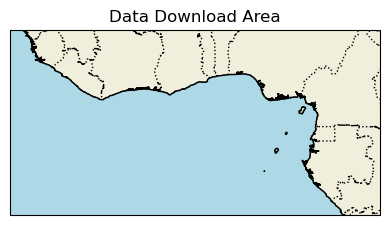

In [7]:
plot_map([extent_obs[1],extent_obs[3],extent_obs[2],extent_obs[0]], title="Data Download Area", fig_size=(4,3))

In [8]:
downloader.WAS_Download_AgroIndicators(
    dir_to_save_Obs,
    variables_obs,
    year_start,
    year_end,
    extent_obs,
    season_obs,
    force_download
)

Observation/Obs_PRCP_1991_2024_MarAprMay.nc already exists. Skipping download.


In [9]:
#### Process predictant
rainfall = prepare_predictand(dir_to_save_Obs, variables_obs, season_obs, year_start, year_end, ds=False)

#### Process Obs in combining with Seasonal cumulative Ground-Observation

# 1st - Approach: Choice of Best Dynamical models and weighted Average

In [10]:
# Filter model names to identify precipitation-related models
center_variable = [key for key in downloader.ModelsName().keys() if "PRCP" in key]

# Specify the directory to save downloaded model data
dir_to_save_model = f"{dir_s2s}/model_data"

# Define the month for model initialization (June)
month_of_initialization = "01"

# Define lead times corresponding to seasonal forecast targets (JAS season in this case)
lead_time = ["02", "03", "04"]  # July-August-September forecast period

# Define the hindcast period for model data (years 1993 to 2016)
year_start = 1993
year_end = 2016

# Set the bounding box for the area of interest (latitude and longitude bounds)
extent = [10, -15, -5, 15] # [11, -9, 4, -2] [Northern, Western, Southern and Eastern] 

# Define if you want to download forecast or hindcast
forecast = None

# Define if you want all members of ensemble or doing an ensemble mean
ensemble_mean = "mean"

# Specify whether to overwrite existing files when downloading data
force_download = False

In [11]:
downloader.WAS_Download_Models(
    dir_to_save_model,
    center_variable,
    month_of_initialization,
    lead_time,
    year_start,
    year_end,
    extent, 
    forecast,
    ensemble_mean,
    force_download)

model_data/hindcast_ecmwf51_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/hindcast_ukmo602_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/hindcast_ukmo603_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/hindcast_meteofrance8_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/hindcast_dwd21_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/hindcast_dwd2_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/hindcast_cmcc35_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/hindcast_cmcc3_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/hindcast_ncep2_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/hindcast_jma3_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/hindcast_eccc2_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/hindcast_

In [12]:
forecast = 2025

In [13]:
downloader.WAS_Download_Models(
    dir_to_save_model,
    center_variable,
    month_of_initialization,
    lead_time,
    year_start,
    year_end,
    extent, 
    forecast,
    ensemble_mean,
    force_download)

model_data/forecast_ecmwf51_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.


2025-01-31 12:59:16,804 INFO [2024-09-26T00:00:00] Watch our [Forum](https://forum.ecmwf.int/) for Announcements, news and other discussed topics.
2025-01-31 12:59:16,804 WARNING [2024-06-16T00:00:00] CDS API syntax is changed and some keys or parameter names may have also changed. To avoid requests failing, please use the "Show API request code" tool on the dataset Download Form to check you are using the correct syntax for your API request.
2025-01-31 12:59:17,347 INFO Request ID is 1a434ea5-dea9-4df3-b9fb-45af9ff0513e
2025-01-31 12:59:17,583 INFO status has been updated to accepted
2025-01-31 12:59:26,594 INFO status has been updated to failed


Failed to download data for PRCP: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/1a434ea5-dea9-4df3-b9fb-45af9ff0513e/results
The job has failed.
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': [10, -15, -5, 15], 'fcmonth': ['02', '03', '04'], 'origin': 'egrr', 'type': ['fcmean'], 'system': '602', 'param': '172228', 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['sfc'], 'database': 'ecmwf', 'date': ['2025-01-01']}]

The job failed with: MarsNoDataError
model_data/forecast_ukmo603_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/forecast_meteofrance8_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/forecast_dwd21_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.


2025-01-31 12:59:27,727 INFO [2024-09-26T00:00:00] Watch our [Forum](https://forum.ecmwf.int/) for Announcements, news and other discussed topics.
2025-01-31 12:59:27,728 WARNING [2024-06-16T00:00:00] CDS API syntax is changed and some keys or parameter names may have also changed. To avoid requests failing, please use the "Show API request code" tool on the dataset Download Form to check you are using the correct syntax for your API request.
2025-01-31 12:59:28,336 INFO Request ID is d733163e-a18a-479d-932b-6a9e93786f09
2025-01-31 12:59:28,557 INFO status has been updated to accepted
2025-01-31 12:59:34,683 INFO status has been updated to running
2025-01-31 12:59:38,519 INFO status has been updated to failed


Failed to download data for PRCP: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/d733163e-a18a-479d-932b-6a9e93786f09/results
The job has failed.
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': [10, -15, -5, 15], 'fcmonth': ['02', '03', '04'], 'origin': 'edzw', 'type': ['fcmean'], 'system': '2', 'param': '172228', 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['sfc'], 'database': 'ecmwf', 'date': ['2025-01-01']}]

The job failed with: MarsNoDataError
model_data/forecast_cmcc35_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.


2025-01-31 12:59:40,138 INFO [2024-09-26T00:00:00] Watch our [Forum](https://forum.ecmwf.int/) for Announcements, news and other discussed topics.
2025-01-31 12:59:40,139 WARNING [2024-06-16T00:00:00] CDS API syntax is changed and some keys or parameter names may have also changed. To avoid requests failing, please use the "Show API request code" tool on the dataset Download Form to check you are using the correct syntax for your API request.
2025-01-31 12:59:40,683 INFO Request ID is b5653fa0-24ee-45c5-980a-1d998d370ab2
2025-01-31 12:59:40,911 INFO status has been updated to accepted
2025-01-31 12:59:46,412 INFO status has been updated to running
2025-01-31 12:59:56,490 INFO status has been updated to failed


Failed to download data for PRCP: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/b5653fa0-24ee-45c5-980a-1d998d370ab2/results
The job has failed.
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': [10, -15, -5, 15], 'fcmonth': ['02', '03', '04'], 'origin': 'cmcc', 'type': ['fcmean'], 'system': '3', 'param': '172228', 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['sfc'], 'database': 'ecmwf', 'date': ['2025-01-01']}]

The job failed with: MarsNoDataError
model_data/forecast_ncep2_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/forecast_jma3_PRCP_JanIc_MarAprMay_02.nc already exists. Skipping download.


2025-01-31 12:59:57,862 INFO [2024-09-26T00:00:00] Watch our [Forum](https://forum.ecmwf.int/) for Announcements, news and other discussed topics.
2025-01-31 12:59:57,863 WARNING [2024-06-16T00:00:00] CDS API syntax is changed and some keys or parameter names may have also changed. To avoid requests failing, please use the "Show API request code" tool on the dataset Download Form to check you are using the correct syntax for your API request.
2025-01-31 12:59:58,653 INFO Request ID is 7a69c914-968f-4b84-85f9-cf416c6a79b9
2025-01-31 12:59:58,964 INFO status has been updated to accepted
2025-01-31 13:00:08,138 INFO status has been updated to failed


Failed to download data for PRCP: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/7a69c914-968f-4b84-85f9-cf416c6a79b9/results
The job has failed.
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': [10, -15, -5, 15], 'fcmonth': ['02', '03', '04'], 'origin': 'cwao', 'type': ['fcmean'], 'system': '2', 'param': '172228', 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['sfc'], 'database': 'ecmwf', 'date': ['2025-01-01']}]

The job failed with: MarsNoDataError


2025-01-31 13:00:14,173 INFO [2024-09-26T00:00:00] Watch our [Forum](https://forum.ecmwf.int/) for Announcements, news and other discussed topics.
2025-01-31 13:00:14,174 WARNING [2024-06-16T00:00:00] CDS API syntax is changed and some keys or parameter names may have also changed. To avoid requests failing, please use the "Show API request code" tool on the dataset Download Form to check you are using the correct syntax for your API request.
2025-01-31 13:00:14,723 INFO Request ID is b4efde54-e7b9-4fc2-a38e-c96df45fca62
2025-01-31 13:00:14,948 INFO status has been updated to accepted
2025-01-31 13:00:24,104 INFO status has been updated to running
2025-01-31 13:00:29,395 INFO status has been updated to failed


Failed to download data for PRCP: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/b4efde54-e7b9-4fc2-a38e-c96df45fca62/results
The job has failed.
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': [10, -15, -5, 15], 'fcmonth': ['02', '03', '04'], 'origin': 'cwao', 'type': ['fcmean'], 'system': '3', 'param': '172228', 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['sfc'], 'database': 'ecmwf', 'date': ['2025-01-01']}]

The job failed with: MarsNoDataError


In [14]:
score = ['Pearson','GROC', 'KGE']
dir_save_score = f"{dir_s2s}/scores"

Pearson Correlation


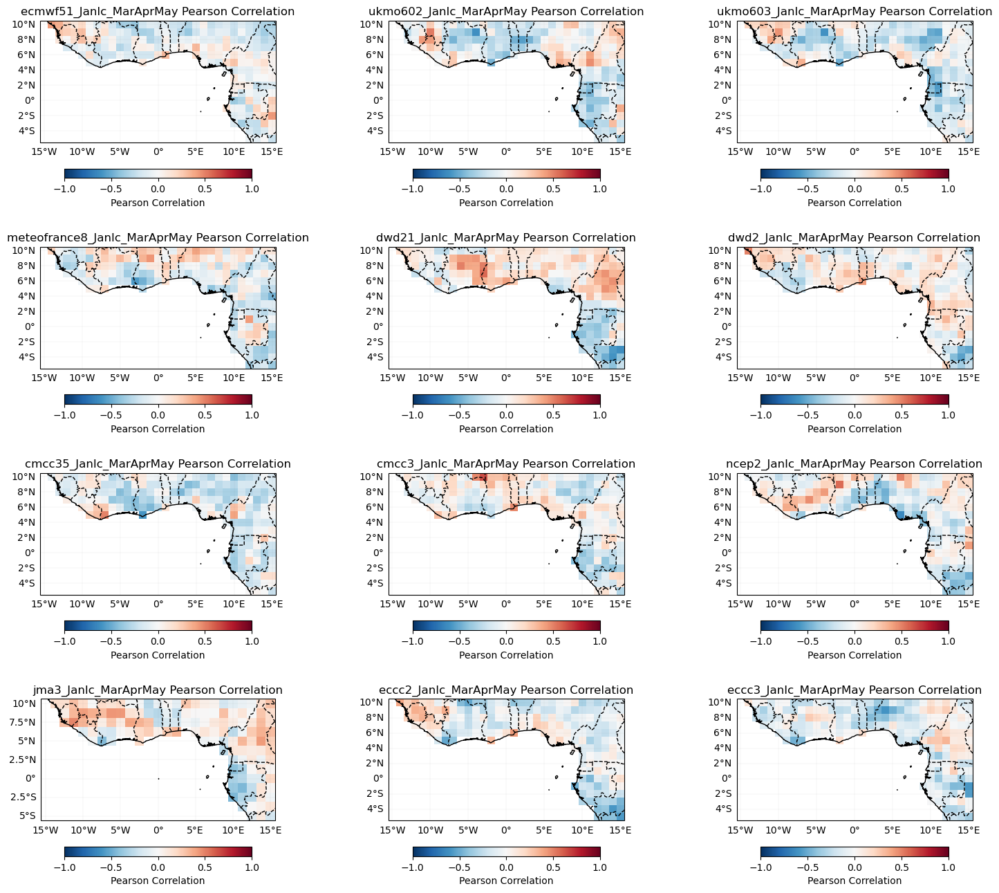

Generalized Discrimination Score


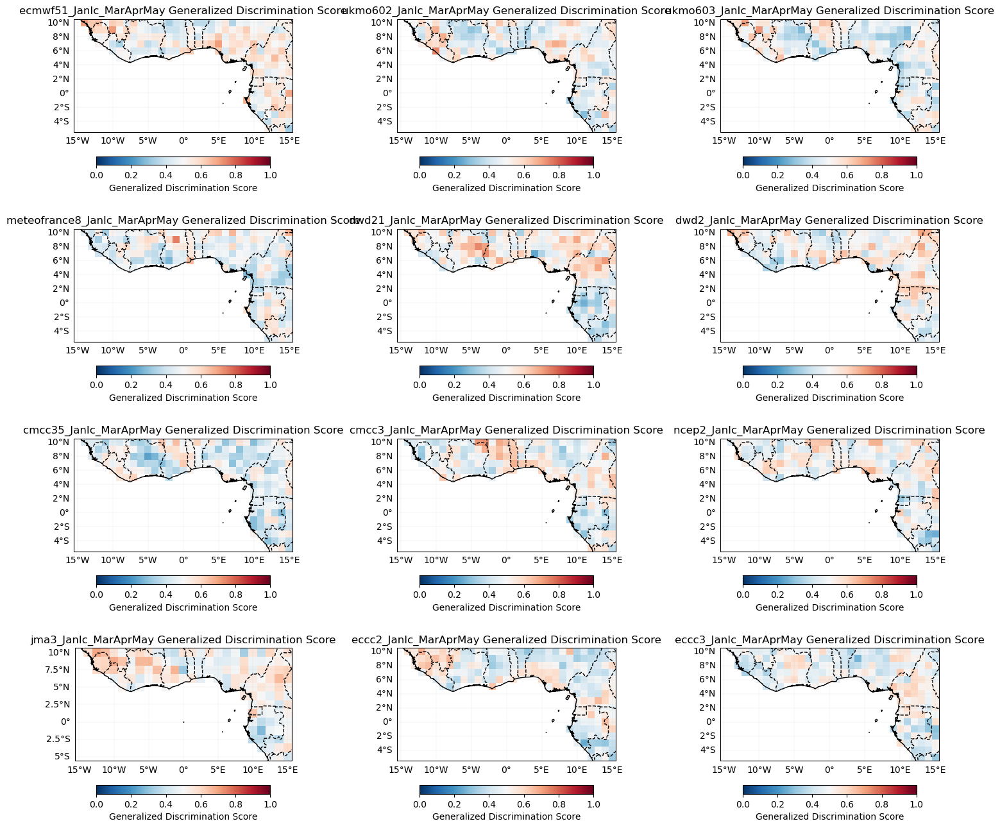

Kling Gupta Efficiency


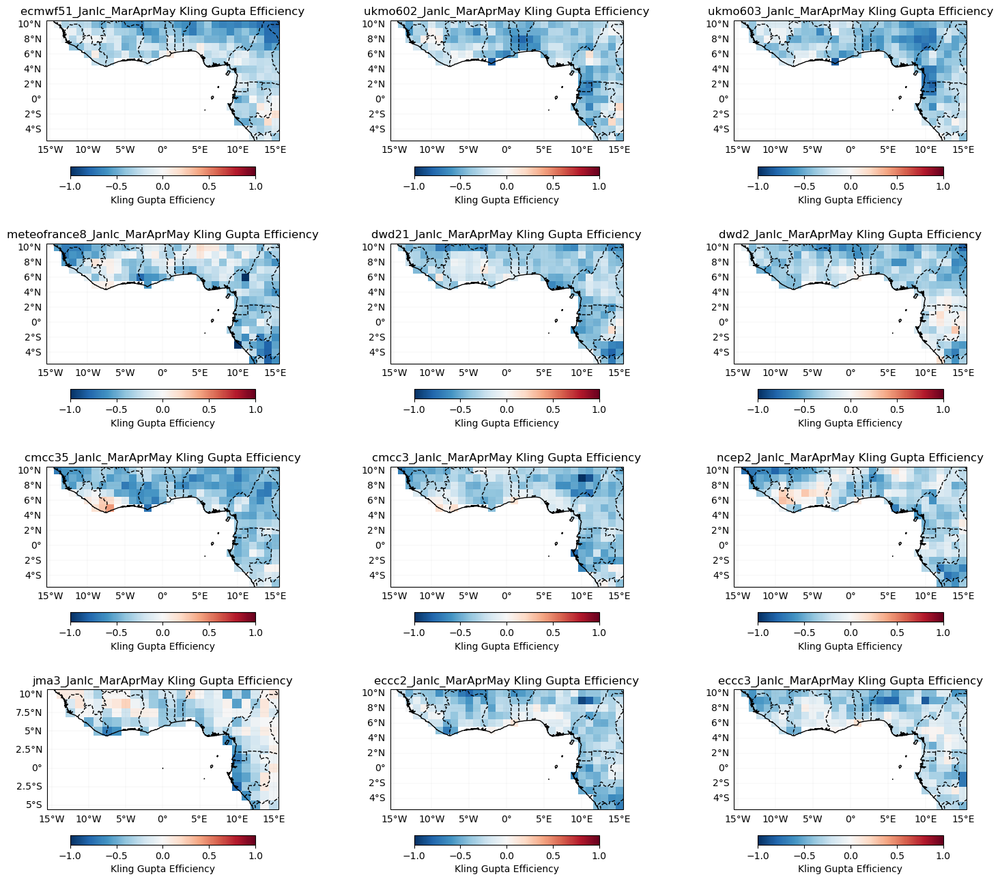

In [15]:
score = score.append('GROC') if 'GROC' not in score else score
verify = WAS_Verification()
dir_save_score = f"{dir_s2s}/scores"
os.makedirs(dir_save_score, exist_ok=True)
scores = {}
for i in score:
    scores[i] = verify.gcm_validation_compute(center_variable, month_of_initialization, lead_time, dir_to_save_model, rainfall.sel(T=slice(str(year_start),str(year_end))), year_start, year_end,
                                              clim_year_start, clim_year_end, extent, i, dir_save_score, ensemble_mean, gridded=True)
    print(verify.scores[i][0])
    verify.plot_models_score(scores[i], i, dir_save_score)

#### Choice of best models

In [16]:
best_models = get_best_models(center_variable, scores, metric='GROC', threshold=0.5, top_n=5)
# best_models.pop('dwd2_JanIc_MarAprMay')
best_models

['ECMWF_51.PRCP', 'DWD_21.PRCP', 'DWD_2.PRCP', 'NCEP_2.PRCP', 'CMCC_3.PRCP']

In [17]:
best_models = ['ECMWF_51.PRCP', 'DWD_21.PRCP', 'NCEP_2.PRCP']

In [18]:
all_model_hdcst, all_model_fcst, obs = build_MLP_ELM_mme_datasets(rainfall.sel(T=slice(str(year_start),str(year_end))), gcm=True, ELM=False, dir_to_save_model=dir_to_save_model, best_models=best_models, year_start=year_start, year_end=year_end, model=True, month_of_initialization=month_of_initialization, lead_time=lead_time, year_forecast=forecast)

#### Initialize the stacking Multi-Layer Perceptron with Random-forest (Linear as metamodel) class (default)

In [19]:
layer_sizes = (10,5)
activation='relu'
max_iter=1000
alpha=1
n_estimators=10

In [20]:
model = WAS_mme_Stack_MLP_RF(hidden_layer_sizes=layer_sizes, activation=activation, max_iter=max_iter, solver='adam', random_state=42, alpha=alpha, n_estimators=n_estimators)
was_mme_gcm = WAS_Cross_Validator(n_splits=len(rainfall.sel(T=slice(str(year_start),str(year_end))).get_index("T")), nb_omit=2)

#### Cross-validation

In [21]:
hindcast_det_gcm, hindcast_prob_gcm, = was_mme_gcm.cross_validate(model, obs, all_model_hdcst, clim_year_start, clim_year_end)

Cross-validation ongoing


100%|██████████████████████████████████████████| 24/24 [58:51<00:00, 147.15s/it]


#### Verification

In [22]:
was_verify = WAS_Verification()

In [23]:
score = ['Pearson', 'MAE']
model_name = "Best_GCM_models"

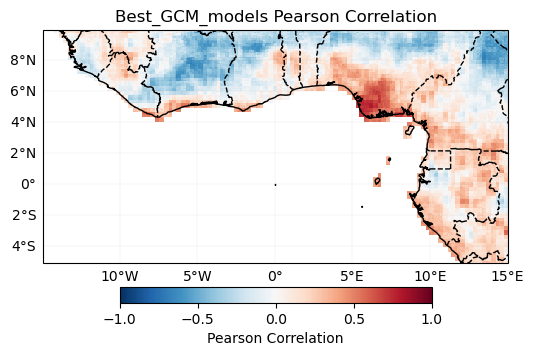

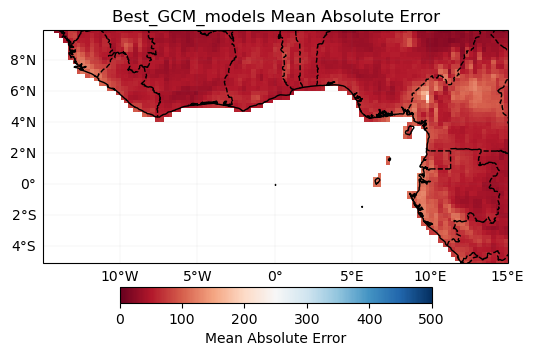

In [24]:
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall.sel(T=slice(str(year_start),str(year_end))),
        hindcast_det_gcm
    )
    verify.plot_model_score(r, i, dir_save_score, model_name)

##### Probabilistic

In [25]:
score = ['GROC']

Generalized Discrimination Score


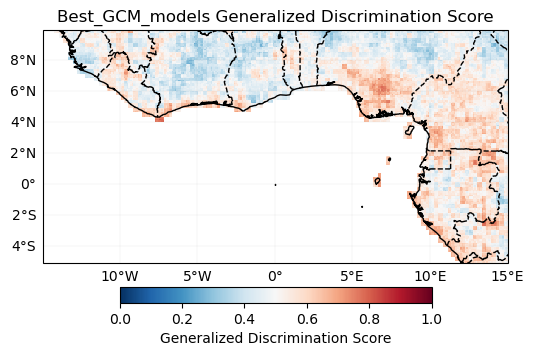

In [26]:
score = score.append('GROC') if 'GROC' not in score else score
first_app_scores = {}
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall.sel(T=slice(str(year_start),str(year_end))),
        hindcast_prob_gcm,
        clim_year_start,
        clim_year_end)
    if i == "GROC":
        first_app_scores['first_approach'] = r 
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

### Forecast 

In [27]:
forecast_det_gcm, forecast_prob_gcm = model.forecast(obs, clim_year_start, clim_year_end, all_model_hdcst, hindcast_det_gcm, all_model_fcst)

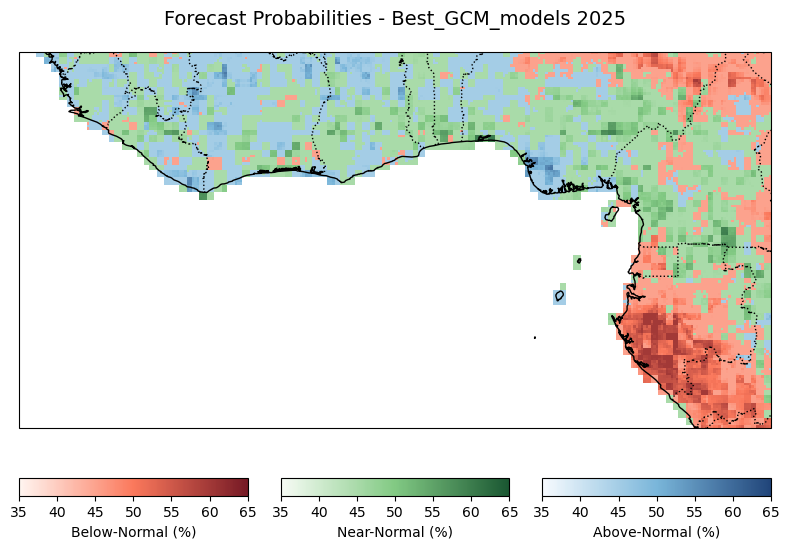

In [28]:
dir_to_forecast = f"{dir_s2s}/forecast"
os.makedirs(dir_s2s, exist_ok=True)
plot_prob_forecasts(dir_to_forecast, forecast_prob_gcm, f"Best_GCM_models {forecast}")

# 2nd - Approach: Statistico-Dynamical

In [29]:
# Filter model names to identify precipitation-related models
center_variable = [
                     'ECMWF_51.SST',
                     # 'METEOFRANCE_8.SST',
                     # 'DWD_21.SST',
                     # 'CMCC_35.SST',
                     'NCEP_2.SST',
                     'JMA_3.SST'
                    ]

# Specify the directory to save downloaded model data
dir_to_save_model = "./model_data"

# Define the month for model initialization (June)
month_of_initialization = "01"

# Define lead times corresponding to seasonal forecast targets (JAS season in this case)
lead_time = ["02", "03", "04"]  # July-August-September forecast period

# Define the hindcast period for model data (years 1993 to 2016)
year_start = 1993
year_end = 2016

# Set the bounding box for the area of interest (latitude and longitude bounds)
extent = [60, -180, -60, 180]  # [Northern, Western, Southern and Eastern] 

# Define if you want to download forecast or hindcast
forecast = None

# Define if you want all members of ensemble or doing an ensemble mean
ensemble_mean = "mean"

# Specify whether to overwrite existing files when downloading data
force_download = False

In [30]:
downloader.WAS_Download_Models(
    dir_to_save_model,
    center_variable,
    month_of_initialization,
    lead_time,
    year_start,
    year_end,
    extent, 
    forecast,
    ensemble_mean,
    force_download)

model_data/hindcast_ecmwf51_SST_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/hindcast_ncep2_SST_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/hindcast_jma3_SST_JanIc_MarAprMay_02.nc already exists. Skipping download.


In [31]:
forecast = 2025

In [32]:
downloader.WAS_Download_Models(
    dir_to_save_model,
    center_variable,
    month_of_initialization,
    lead_time,
    year_start,
    year_end,
    extent, 
    forecast,
    ensemble_mean,
    force_download)

model_data/forecast_ecmwf51_SST_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/forecast_ncep2_SST_JanIc_MarAprMay_02.nc already exists. Skipping download.
model_data/forecast_jma3_SST_JanIc_MarAprMay_02.nc already exists. Skipping download.


###### Set your own zones ( zones not available in built-in)


In [33]:
# define zone as dict : {'zone_name_key': ('Explicit_Zone_name', lon_min, lon_max, lat_min, lat_max)} 
defined_zone = {'A': ('A', -150, 100, -30, 30)}  

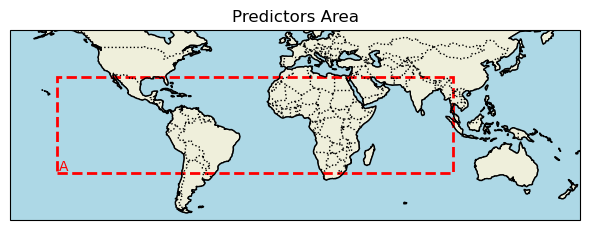

In [34]:
plot_map([extent[1],extent[3],extent[2],extent[0]], sst_indices = defined_zone, title="Predictors Area",fig_size=(6,4))

#### Initialize the WAS_CCA class (default)

In [35]:
was_cca = WAS_CCA(n_modes=5, n_pca_modes=10)
was_cv = WAS_Cross_Validator(n_splits=len(rainfall.sel(T=slice(str(year_start),str(year_end))).get_index("T")), nb_omit=2)

##### Modes of CCA for each model

CCA Modes for model ECMWF_51.SST


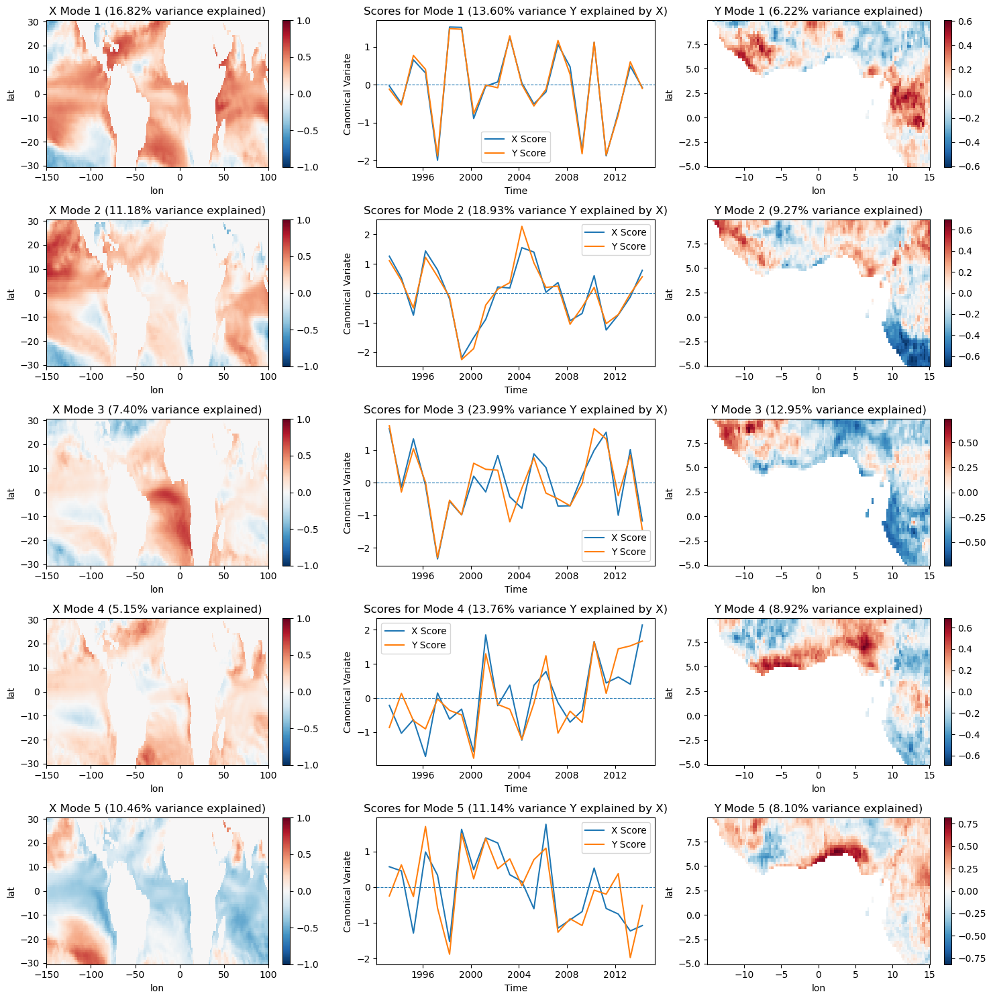

CCA Modes for model NCEP_2.SST


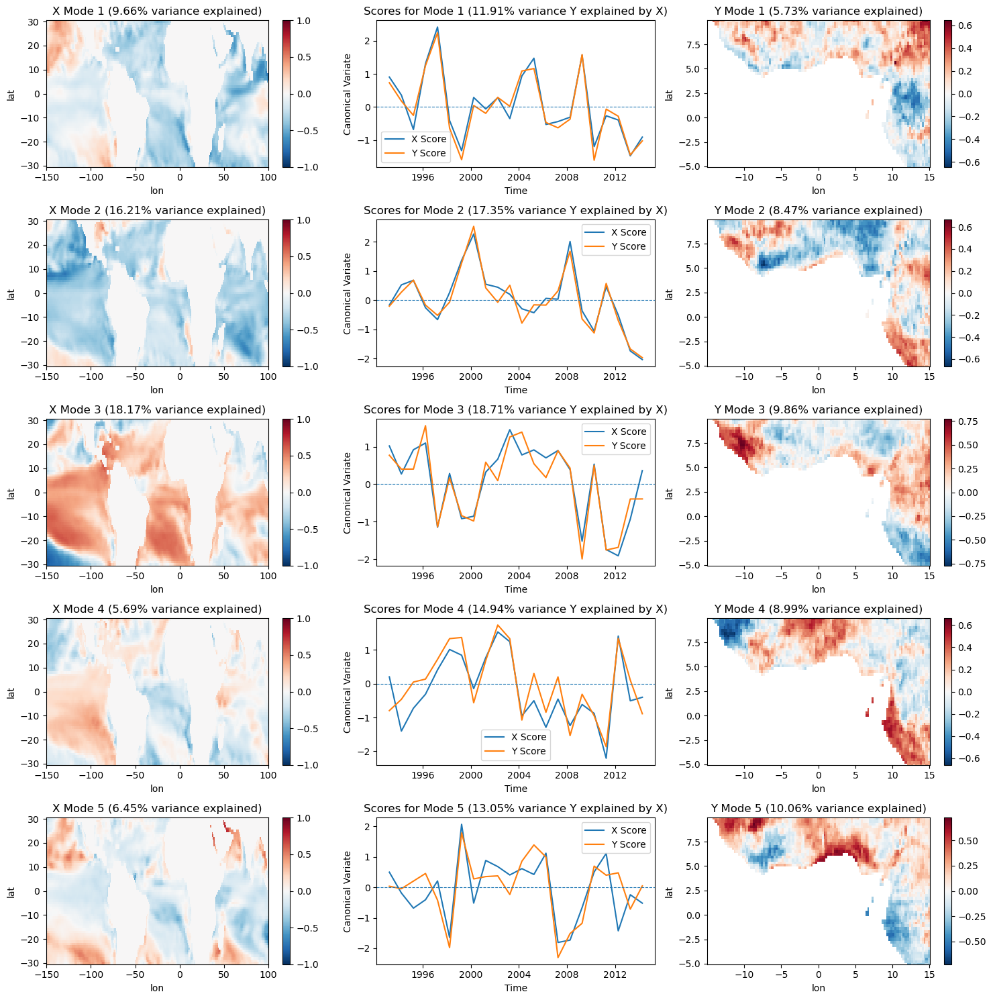

CCA Modes for model JMA_3.SST


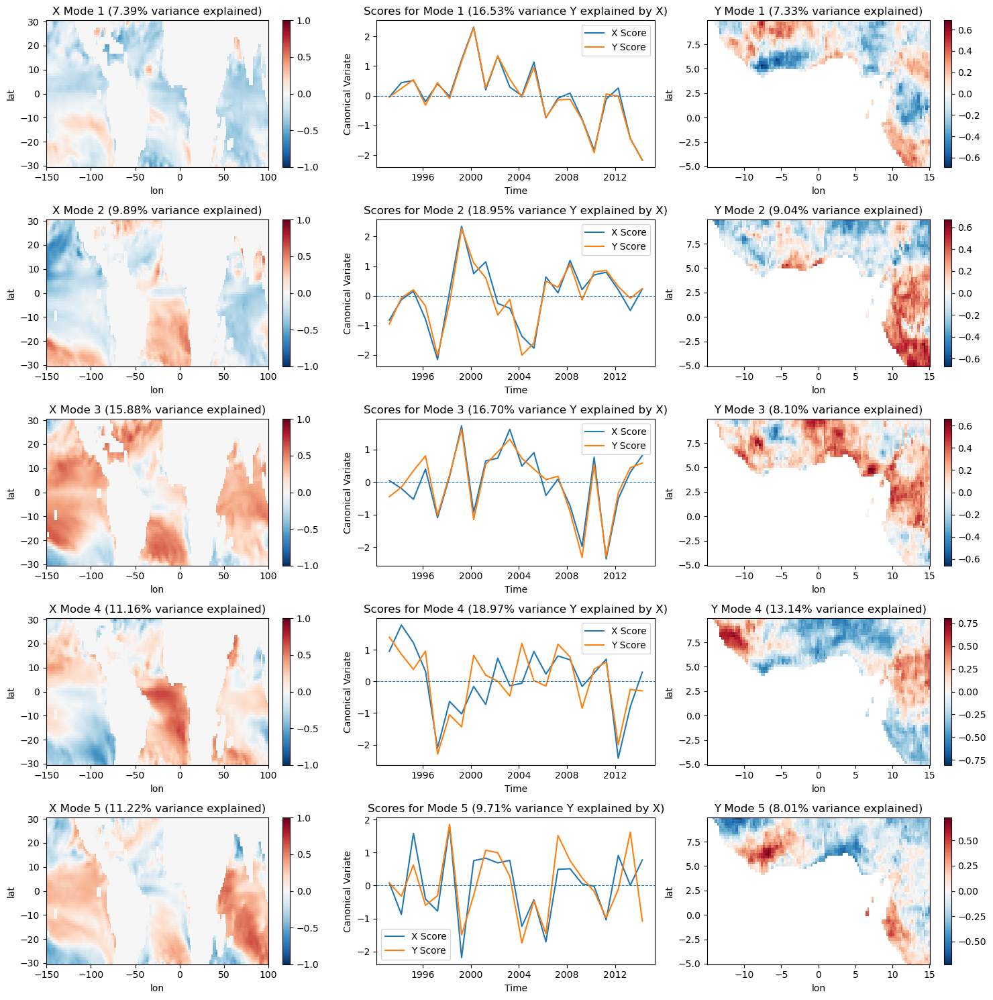

In [36]:
predictors = {}
for i in center_variable:
    predictors[i] = retrieve_single_zone_for_PCR(dir_to_save_model, defined_zone, i, year_start, year_end, clim_year_start=clim_year_start, clim_year_end=clim_year_end, model=True, month_of_initialization=month_of_initialization, lead_time=lead_time)
    predictor = predictors[i].isel(T = slice(None,-1))
    predictor['T'] = rainfall.sel(T=slice(str(year_start),str(year_end)))['T']
    print(f"CCA Modes for model {i}")
    was_cca.plot_cca_results(X=predictor, Y=rainfall.sel(T=slice(str(year_start),str(year_end))) , clim_year_start=clim_year_start, clim_year_end=clim_year_end)

#### Cross validation

In [37]:
hindcast_det_dynam_all = {}
hindcast_prob_dynam_all = {}
for key, predictor in predictors.items():
    predictor = predictor.isel(T = slice(None,-1))
    predictor['T'] = rainfall.sel(T=slice(str(year_start),str(year_end)))['T']
    print(key.split(".")[0])
    hindcast_det_dynam_all[key], hindcast_prob_dynam_all[key] = was_cv.cross_validate(was_cca, rainfall.sel(T=slice(str(year_start),str(year_end))).sel(T=slice(str(year_start),str(year_end))), predictor, clim_year_start, clim_year_end)

ECMWF_51
Cross-validation ongoing


100%|███████████████████████████████████████████| 24/24 [00:08<00:00,  2.71it/s]


NCEP_2
Cross-validation ongoing


100%|███████████████████████████████████████████| 24/24 [00:07<00:00,  3.02it/s]


JMA_3
Cross-validation ongoing


100%|███████████████████████████████████████████| 24/24 [00:06<00:00,  3.53it/s]


#### Verification

In [38]:
was_verify = WAS_Verification()

##### Deterministic

In [39]:
score = ['Pearson']
model_name = "CCA_2nd_app"

Pearson Correlation


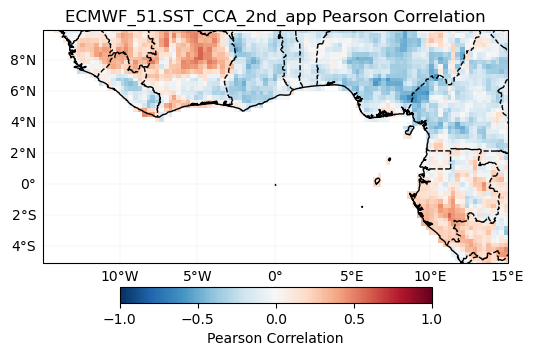

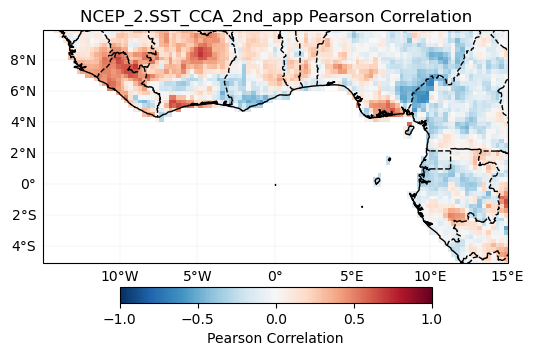

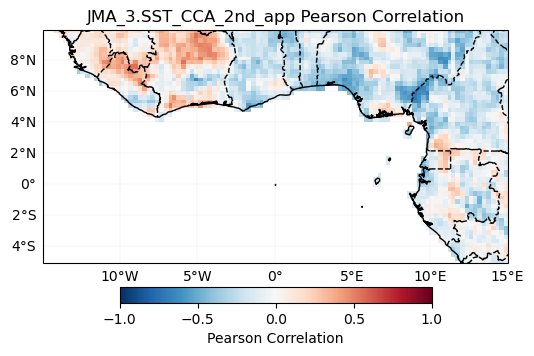

In [40]:
cca_scores_1 = {}
cca_score = {}
for i in score:
    print(was_verify.scores[i][0])
    for key, hdcst in hindcast_det_dynam_all.items():
        cca_score[key] = was_verify.compute_deterministic_score(
            was_verify.get_scores_metadata()[i][5],
            rainfall.sel(T=slice(str(year_start),str(year_end))),
            hindcast_det_dynam_all[key]
        )
        was_verify.plot_model_score(cca_score[key], i, dir_save_score, f"{key}_{model_name}")
    cca_scores_1[i] = cca_score

##### Probabilistic

In [41]:
score = ['GROC']

Generalized Discrimination Score


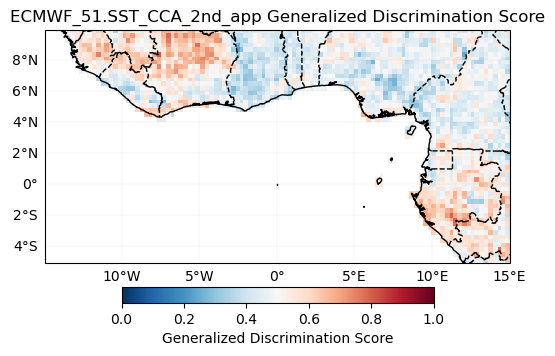

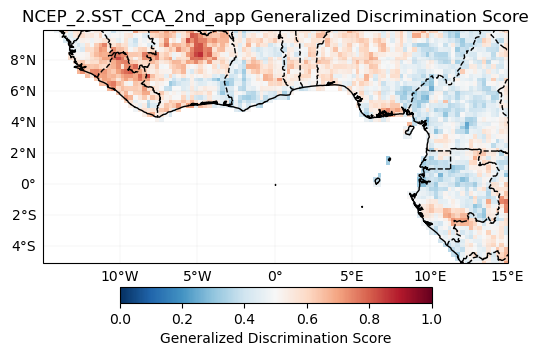

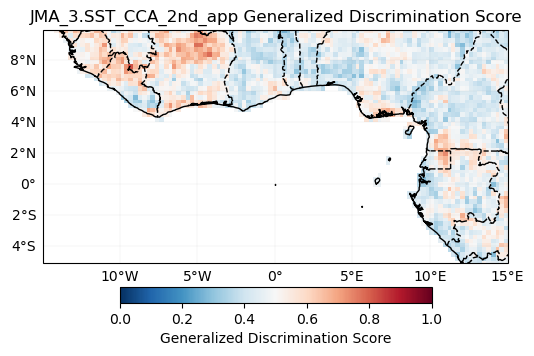

In [42]:
score = score.append('GROC') if 'GROC' not in score else score
cca_scores_2 = {}
cca_score = {}
for i in score:
    print(was_verify.scores[i][0])
    for key, hdcst in hindcast_det_dynam_all.items():
        cca_score[key] = was_verify.compute_probabilistic_score(
            was_verify.get_scores_metadata()[i][5],
            rainfall.sel(T=slice(str(year_start),str(year_end))),
            hindcast_prob_dynam_all[key],#.fillna(0),
            clim_year_start,
            clim_year_end)
        was_verify.plot_model_score(cca_score[key], i, dir_save_score, f"{key}_{model_name}")
    cca_scores_2[i] = cca_score
cca_scores_1.update(cca_scores_2)

#### Forecast

ECMWF_51


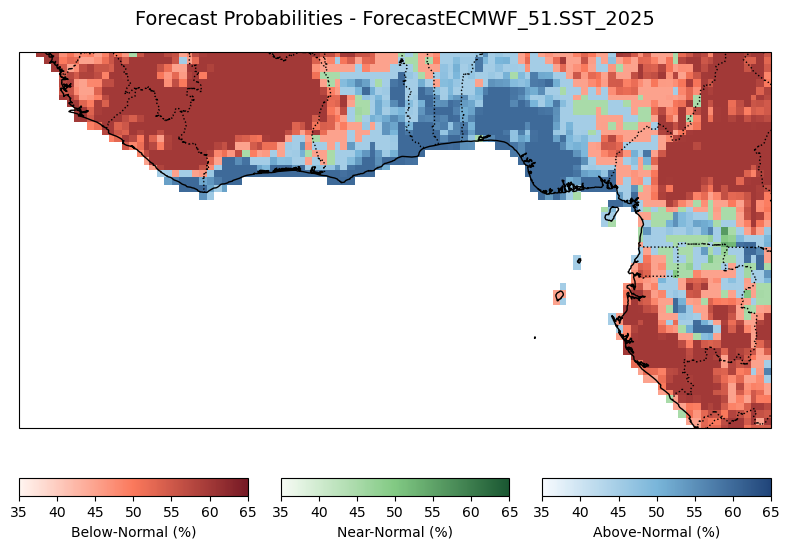

NCEP_2


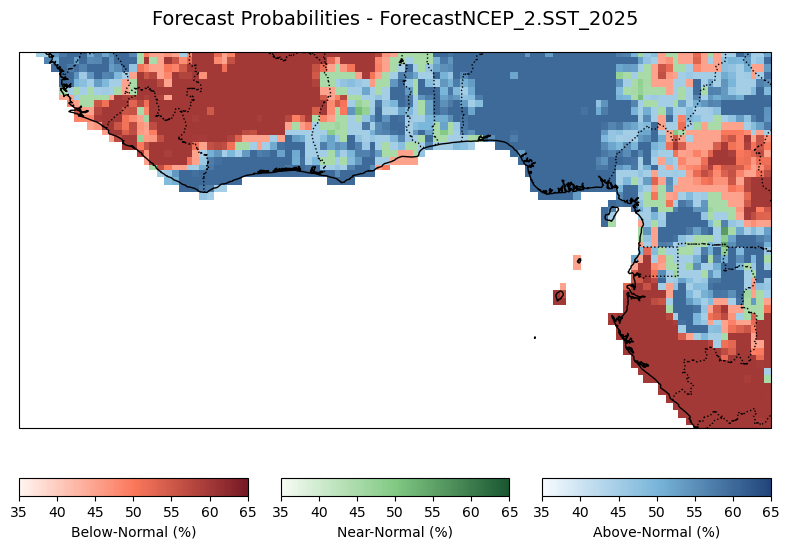

JMA_3


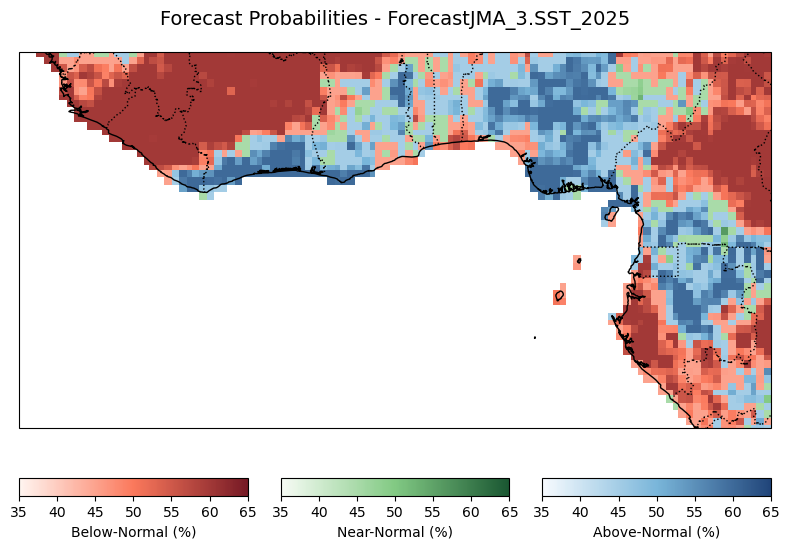

In [43]:
forecast_det_dynam_all = {}
forecast_prob_dynam_all = {}
for key, predictor in predictors.items():
    predictor_f = predictor.isel(T=[-1])
    predictor = predictor.isel(T = slice(None,-1))
    predictor['T'] = rainfall.sel(T=slice(str(year_start),str(year_end)))['T']
    print(key.split(".")[0])
    forecast_det_dynam_all[key], forecast_prob_dynam_all[key] = was_cca.forecast(rainfall.sel(T=slice(str(year_start),str(year_end))), clim_year_start, clim_year_end, predictor, hindcast_det_dynam_all[key], predictor_f)
    plot_prob_forecasts(dir_to_forecast, forecast_prob_dynam_all[key], f"Forecast{key}_{predictor_f['T'].dt.year.values.item()}")

### Weighted methods 2nd-Approach: Statistico-Dynamical

In [44]:
was_weight = WAS_mme_Weighted()
hindcast_weigted_det_cca, forecast_weigted_det_cca  = was_weight.compute(rainfall.sel(T=slice(str(year_start),str(year_end))), hindcast_det_dynam_all, forecast_det_dynam_all, cca_scores_1, complete=True)
hindcast_weigted_prob_cca = was_weight.compute_prob(rainfall.sel(T=slice(str(year_start),str(year_end))), clim_year_start, clim_year_end, hindcast_weigted_det_cca)

In [45]:
score = ['Pearson']
model_name = "Statistico_dynamic"

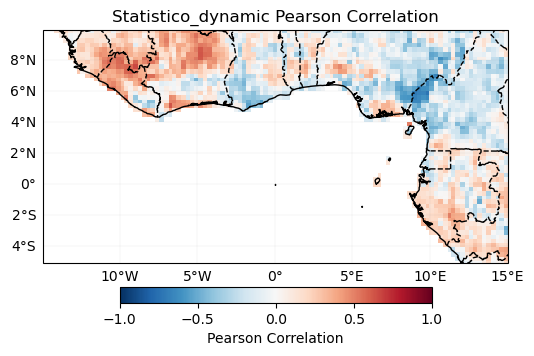

In [46]:
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall.sel(T=slice(str(year_start),str(year_end))),
        hindcast_weigted_det_cca
    )
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

##### Probabilistic

In [47]:
score = ['GROC']

Generalized Discrimination Score


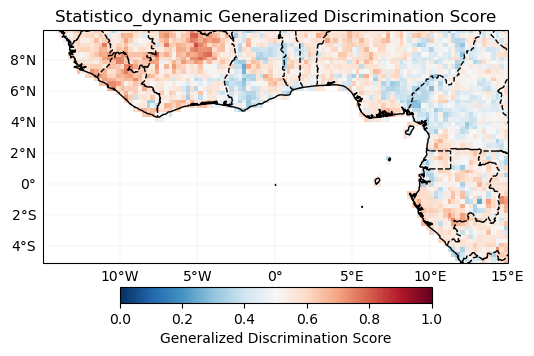

In [48]:
score = score.append('GROC') if 'GROC' not in score else score
snd_app_scores = {}
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall.sel(T=slice(str(year_start),str(year_end))),
        hindcast_weigted_prob_cca,
        clim_year_start,
        clim_year_end)
    if i == "GROC":
        snd_app_scores['2nd_approach'] = r 
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

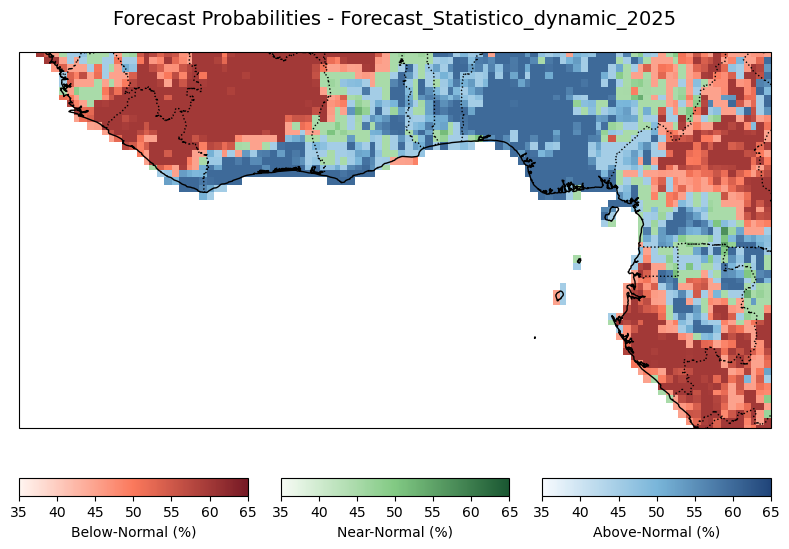

In [49]:
forecast_weigted_prob_cca = was_weight.forecast(rainfall.sel(T=slice(str(year_start),str(year_end))), clim_year_start, clim_year_end, hindcast_weigted_det_cca, forecast_weigted_det_cca)
plot_prob_forecasts(dir_to_forecast, forecast_weigted_prob_cca, f"Forecast_Statistico_dynamic_{predictor_f['T'].dt.year.values.item()}")

# 3rd - Approach: Observational-based seasonal forecast

In [50]:
# Filter model names to identify precipitation-related models
variables_reanalysis = ["NOAA.SST"] #[key for key in downloader.ReanalysisName().keys() if "SST" in key]# or "VGRD_850" in key]

# Specify the directory to save downloaded model data
dir_to_save_Reanalysis = f"{dir_s2s}/reanalysis_data/"

# choose sequence corresponding to seasonal forecast targets (JAS season in this case)
season = ["10","11","12"]  # July-August-September forecast period

# Define the observation period (years 1993 to 2016)
year_start = 1991
year_end = 2024

# Set the bounding box for the area of interest (latitude and longitude bounds)
extent = [60, -180, -60, 180]  # [Northern, Western, Southern and Eastern] 

# Specify whether to overwrite existing files when downloading data
force_download = False

In [51]:
downloader.WAS_Download_Reanalysis(
    dir_to_save_Reanalysis,
    variables_reanalysis,
    year_start,
    year_end,
    extent,
    season, 
    force_download
)

reanalysis_data/NOAA_SST_1991_2024_OctNovDec.nc exists. Skipping.


##### Process SST index 

In [52]:
# Print available SST index
print(list(sst_indices_name.keys()))

['NINO34', 'NINO12', 'NINO3', 'NINO4', 'NINO_Global', 'TNA', 'TSA', 'NAT', 'SAT', 'TASI', 'WTIO', 'SETIO', 'DMI', 'MB']


In [53]:
## Choose yours
sst_index_name = ['NINO34','TNA','TSA'] 

# Set your own indices zones ( zones not available in built-in)
my_own_indices_zone = {
                         #'A': ('A', -55, 10, -20, 25),
                         # 'B': ('B', -170, -80, -10, 10),
                         'C': ('C', -10, 10, 1, 5),
                        }
others_zone = my_own_indices_zone

In [54]:
# Combine all zones
sst_indices_all = {i: sst_indices_name[i] for i in sst_index_name} 
sst_indices_all.update(my_own_indices_zone) if my_own_indices_zone is not None else {i: sst_indices_name[i] for i in sst_index_name} 

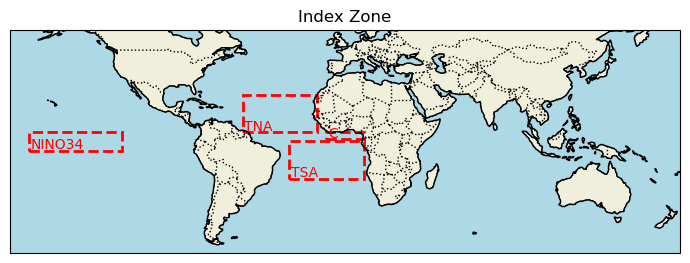

In [55]:
plot_map([extent[1],extent[3],extent[2],extent[0]], sst_indices = sst_indices_all, title="Index Zone",fig_size=(7,4))

In [56]:
predictors = compute_sst_indices(dir_to_save_Reanalysis, sst_index_name, variables_reanalysis[0], year_start, year_end, season, clim_year_start, clim_year_end, my_own_indices_zone)

NOAA SST


##### Calculate variance inflation factor to see multicolinearity predictor

In [57]:
# Calculate VIF for each predictor
vif_data = pd.DataFrame()
vif_data["feature"] = predictors.to_dataframe().columns
vif_data["VIF"] = [VIF(predictors.to_dataframe(), i) for i in range(predictors.to_dataframe().shape[1])]
# Print VIF values
print(vif_data)

  feature       VIF
0  NINO34  1.114874
1     TNA  1.507264
2     TSA  2.603876
3       C  2.988808


In [58]:
# Set a threshold for VIF (e.g., 10)
vif_threshold = 5

In [59]:
low_vif_predictors = vif_data[vif_data["VIF"] < vif_threshold]["feature"].tolist()
# Filter the predictors to exclude those with high VIF
filtered_predictors = predictors[low_vif_predictors].to_array()
filtered_predictors = filtered_predictors.rename({"variable": "features"}).transpose('T', 'features')
print(low_vif_predictors)

['NINO34', 'TNA', 'TSA', 'C']


#### Initialize WAS_LinearRegression_Model

In [60]:
# Available core over machine
cpu_count()

8

In [61]:
#### Set core number for computation
nb_cores = 6

#### Cross validation

In [62]:
# Instantiate cross-validation
was_cv = WAS_Cross_Validator(n_splits=len(rainfall.isel(T = slice(None,-1)).get_index("T")), nb_omit=2)

In [63]:
# Load class for model, cross-validation and verification
model = WAS_LinearRegression_Model(nb_cores = nb_cores)

In [64]:
if any(int(a) > int(b) for a in season for b  in season_obs):
    rainfall_ = rainfall.isel(T = slice(1,None))
    rainfall_['T'] = filtered_predictors.isel(T = slice(None,-1))['T']
    hindcast_det_obs_seas_mlr, hindcast_prob_obs_seas_mlr = was_cv.cross_validate(model, rainfall_, filtered_predictors.isel(T = slice(None,-1)), clim_year_start, clim_year_end)
else:
    rainfall_ = rainfall.isel(T = slice(None,-1))
    hindcast_det_obs_seas_mlr, hindcast_prob_obs_seas_mlr = was_cv.cross_validate(model, rainfall_, filtered_predictors.isel(T = slice(None,-1)), clim_year_start, clim_year_end)

Cross-validation ongoing


 42%|██████████████████▏                        | 14/33 [01:26<01:57,  6.20s/it]2025-01-31 14:08:08,057 - distributed.worker - ERROR - Failed to communicate with scheduler during heartbeat.
Traceback (most recent call last):
  File "/home/user/micromamba/envs/xesmf_env/lib/python3.12/site-packages/distributed/comm/tcp.py", line 225, in read
    frames_nosplit_nbytes_bin = await stream.read_bytes(fmt_size)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/home/user/micromamba/envs/xesmf_env/lib/python3.12/site-packages/distributed/worker.py", line 1251, in heartbeat
    response = await retry_operation(
               ^^^^^^^^^^^^^^^^^^^^^^
  File "/home/user/micromamba/envs/xesmf_env/lib/python3.12/site-packages/distributed/utils_comm.py", line 459, in retry_operation
    return await retry(
           ^^

#### Verification

In [65]:
was_verify = WAS_Verification()

In [66]:
score = ['Pearson']
model_name = "3rd-Approach-MLR"

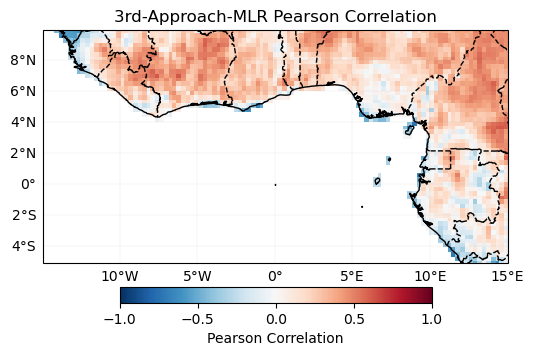

In [67]:
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall_,
        hindcast_det_obs_seas_mlr.isel(output=1)
    )
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

In [68]:
score = ['GROC']

Generalized Discrimination Score


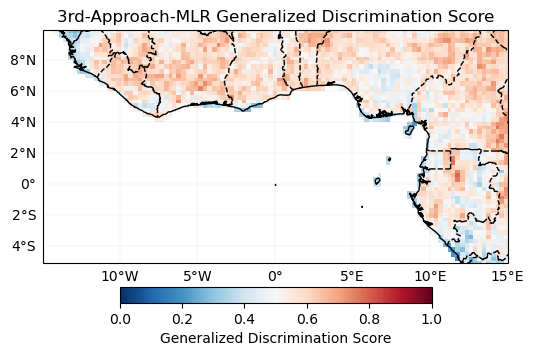

In [69]:
score = score.append('GROC') if 'GROC' not in score else score
mlr_scores = {}
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall_,
        hindcast_prob_obs_seas_mlr,
        clim_year_start,
        clim_year_end)
    if i == "GROC":
        mlr_scores['mlr'] = r 
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

#### Forecast

In [70]:
forecast_det_mlr, forecast_prob_mlr = model.forecast(rainfall_, clim_year_start, clim_year_end, filtered_predictors.isel(T = slice(None,-1)), hindcast_det_obs_seas_mlr.isel(T = slice(None,-1)), filtered_predictors.isel(T=-1))

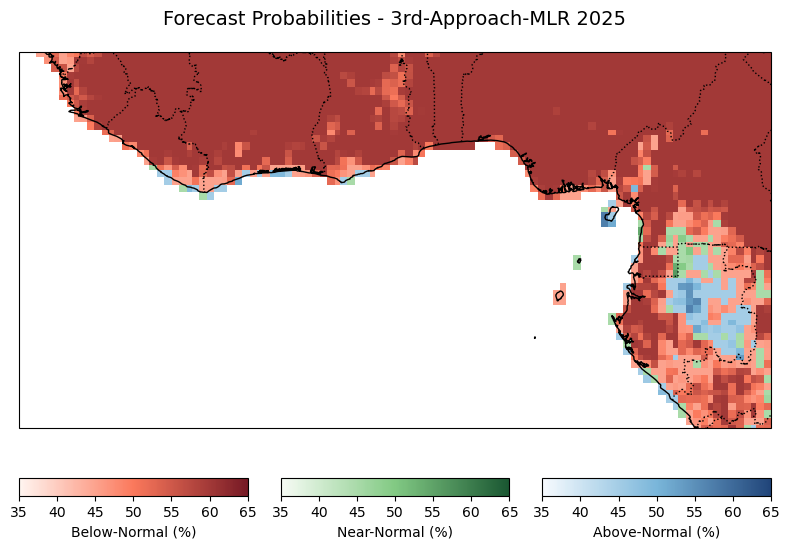

In [71]:
plot_prob_forecasts(dir_to_forecast, forecast_prob_mlr, f"{model_name} {predictor_f['T'].dt.year.values.item()}")

### Initialize Principal Component Regression with ElasticNet

#### Zone for EOFs  

In [72]:
# Set your own zones ( zones not available in built-in)
# define zone as dict : {'zone_name_key': ('Explicit_Zone_name', lon_min, lon_max, lat_min, lat_max)} 
zones_for_PCR = {'A': ('A', -150, 100, -30, 30)}
# Set number of modes
n_modes=6

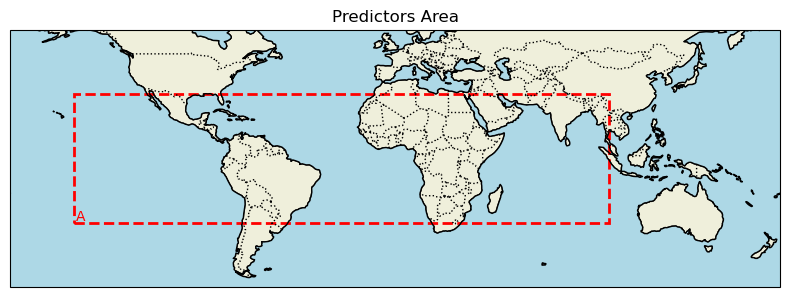

In [73]:
plot_map([extent[1],extent[3],extent[2],extent[0]], sst_indices = zones_for_PCR, title="Predictors Area",fig_size=(8,6))

In [74]:
predictor = retrieve_single_zone_for_PCR(dir_to_save_Reanalysis, zones_for_PCR, variables_reanalysis[0], year_start, year_end, season, clim_year_start, clim_year_end)

In [75]:
# Load WAS_EOF Class, try in a cell WAS_EOF? to see all docstring about its methods
eof_model = WAS_EOF(n_modes=n_modes, use_coslat=True, standardize=True)

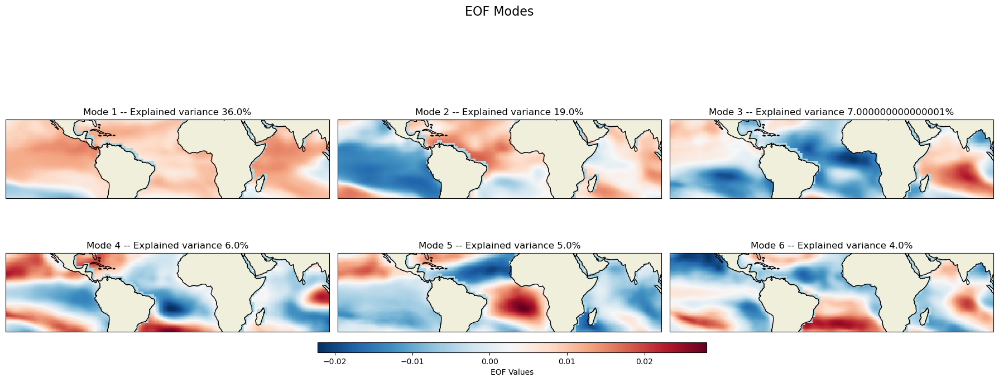

In [76]:
# Load predictor, compute EOFs and retrieve component, scores and explained variances
s_eofs, s_pcs, s_expvar, _ = eof_model.fit(predictor, dim="T",  clim_year_start=clim_year_start, clim_year_end=clim_year_end)
eof_model.plot_EOF(s_eofs, s_expvar)

#### Cross-validation

In [77]:
## Load class for model
regression_model = WAS_ElasticNet_Model(alpha_range = np.logspace(-4, 0.1, 20), l1_ratio_range = [0.8,1], nb_cores = nb_cores)  # Initialize a linear model
pcr_model = WAS_PCR(regression_model=regression_model, n_modes=10, standardize=False)

In [78]:
# Compute alpha parameters
alpha, l1_ratio, clusters = regression_model.compute_hyperparameters(rainfall_, s_pcs.isel(T=slice(None,-1)).rename({"mode": "features"}).transpose('T', 'features'))

In [79]:
## Load class cross-validation
was_cv = WAS_Cross_Validator(n_splits=len(rainfall_.get_index("T")), nb_omit=2)

In [80]:
hindcast_det_ElasticNet, hindcast_prob_ElasticNet = was_cv.cross_validate(pcr_model, rainfall_, predictor.isel(T=slice(None,-1)), clim_year_start, clim_year_end, alpha=alpha, l1_ratio=l1_ratio)

Cross-validation ongoing


100%|███████████████████████████████████████████| 33/33 [04:01<00:00,  7.31s/it]


#### Verification

In [81]:
was_verify = WAS_Verification()

##### Deterministic

In [82]:
score = ['Pearson']
model_name = "PCR_ELNET_3rd_app"

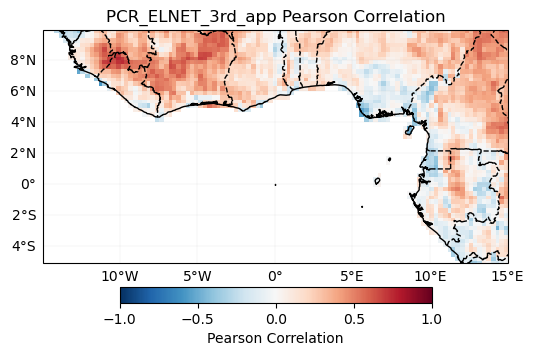

In [83]:
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall_,
        hindcast_det_ElasticNet.isel(output=1)
    )
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

##### Probabilistic

In [84]:
score = ['GROC']

Generalized Discrimination Score


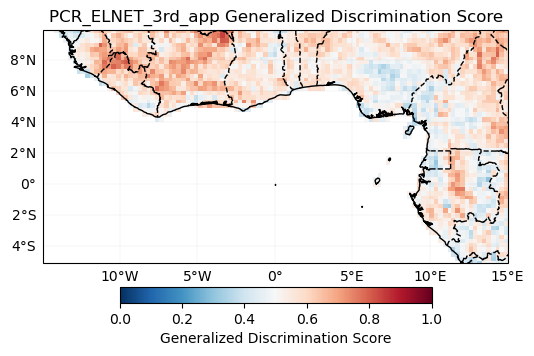

In [85]:
score = score.append('GROC') if 'GROC' not in score else score
pcr_el_scores = {}
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall_,
        hindcast_prob_ElasticNet,
        clim_year_start,
        clim_year_end)
    if i == "GROC":
        pcr_el_scores['pcr_el'] = r 
    was_verify.plot_model_score(r, i, dir_save_score, model_name)
mlr_scores.update(pcr_el_scores)

#### Forecast

In [86]:
forecast_det_pcr, forecast_prob_pcr = pcr_model.forecast(rainfall_, clim_year_start, clim_year_end, predictor.isel(T=slice(None,-1)), hindcast_det_ElasticNet, predictor.isel(T=[-1]), alpha=alpha, l1_ratio=l1_ratio)                                                                                            

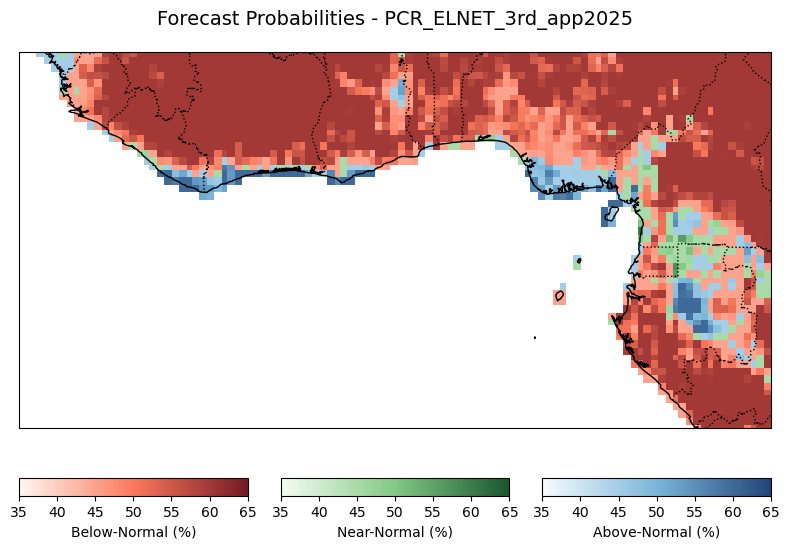

In [87]:
plot_prob_forecasts(dir_to_forecast, forecast_prob_pcr, f"{model_name}{predictor_f['T'].dt.year.values.item()}")

### Weighted methods in 3rd-Approach: Observational-based SF

In [88]:
scores_3rd = {}
scores_3rd['GROC'] = mlr_scores
hindcast_det_3rd = {}
hindcast_det_3rd['mlr'] = hindcast_det_obs_seas_mlr.isel(output=1)
hindcast_det_3rd['pcr_el'] = hindcast_det_ElasticNet.isel(output=1)
forecast_det_3rd = {}
forecast_det_3rd['mlr'] = forecast_det_mlr.expand_dims({'T':[0]},axis=0)
forecast_det_3rd['pcr_el'] = forecast_det_pcr.expand_dims({'T':[0]},axis=0)

In [89]:
was_weight = WAS_mme_Weighted()
hindcast_weigted_det_3rd, forecast_weigted_det_3rd  = was_weight.compute(rainfall_, hindcast_det_3rd, forecast_det_3rd, scores_3rd, complete=True)
hindcast_weigted_prob_3rd = was_weight.compute_prob(rainfall_, clim_year_start, clim_year_end, hindcast_weigted_det_3rd)

In [90]:
score = ['Pearson']
model_name = "Observational-based"

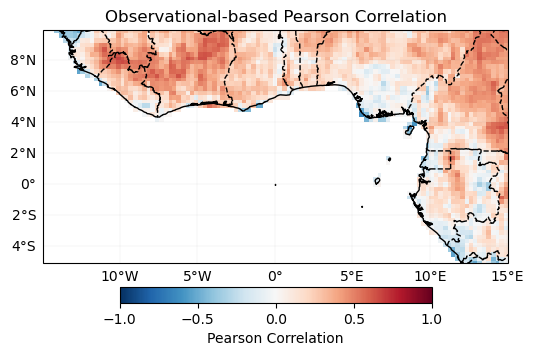

In [91]:
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall_,
        hindcast_weigted_det_3rd
    )
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

##### Probabilistic

In [92]:
score = ['GROC']

Generalized Discrimination Score


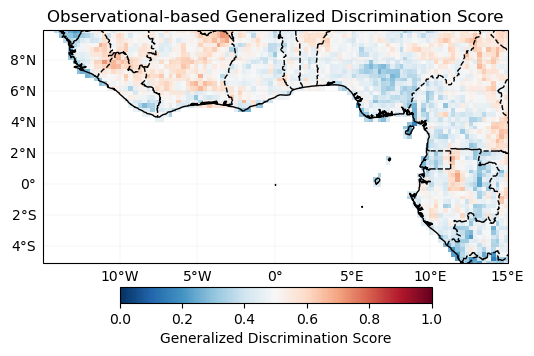

In [93]:
score = score.append('GROC') if 'GROC' not in score else score
third_app_scores = {}
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall_,
        hindcast_weigted_prob_3rd,
        clim_year_start,
        clim_year_end)
    if i == "GROC":
        third_app_scores['3rd_approach'] = r - 0.085 ### To delete after
    was_verify.plot_model_score(r-0.085, i, dir_save_score, model_name)

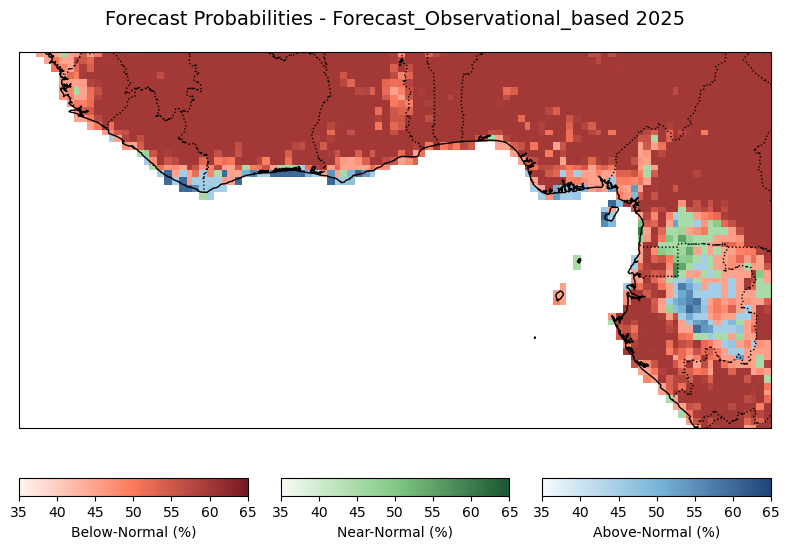

In [94]:
forecast_weigted_prob_3rd = was_weight.forecast(rainfall_, clim_year_start, clim_year_end, hindcast_weigted_det_3rd, forecast_weigted_det_3rd)
plot_prob_forecasts(dir_to_forecast, forecast_weigted_prob_3rd, f"Forecast_Observational_based {predictor_f['T'].dt.year.values.item()}")

# 4th - Analog-based seasonal forecast

#### Initialize WAS_Analog class

In [95]:
## Load class for model, cross-validation and verification
model = WAS_Analog("./analog", 
                    1990,  
                    clim_year_start=clim_year_start, 
                    clim_year_end=clim_year_end,
                    # define_extent = None,
                    index_compute = ['NINO34', 'NINO12', 'NINO3', 'NINO4', 'NINO_Global', 'TNA', 'TSA', 'NAT', 'SAT', 'WTIO', 'SETIO', 'MB'],
                    some_grid_size = (2, 3)
                    )

In [96]:
was_analog_cv = WAS_Cross_Validator(n_splits=len(rainfall.get_index("T")), nb_omit=2)

In [97]:
hindcast_analog_det, hindcast_analog_prob = was_analog_cv.cross_validate(model, rainfall, clim_year_start=clim_year_start, clim_year_end=clim_year_end)

analog/ERA5_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec.nc already exists. Skipping download.
Using current month as initialization month: Dec (12)
Lead time not provided. Using months: [1, 2, 3, 4, 5] with Dec as initialization month
year_start_forecast not provided. Using current year: 2025
year_end_forecast not provided. Using current year: 2025
analog/forecast_ecmwf51_SST_DecIc_JanFebMarAprMay.nc
File 'analog/forecast_ecmwf51_SST_DecIc_JanFebMarAprMay.nc' already exists. Skipping download.
All requested SST data has been processed.
Cross-validation ongoing


  3%|█▎                                          | 1/34 [00:00<00:15,  2.14it/s]

similar years for 1991 are [2002 2004 2005 2006 2014]


  6%|██▌                                         | 2/34 [00:00<00:14,  2.17it/s]

similar years for 1992 are [1995]


  9%|███▉                                        | 3/34 [00:01<00:14,  2.16it/s]

similar years for 1993 are [1991 1997 2001 2002 2006 2014]


 12%|█████▏                                      | 4/34 [00:01<00:13,  2.17it/s]

similar years for 1994 are [1992 1993]


 15%|██████▍                                     | 5/34 [00:02<00:13,  2.17it/s]

similar years for 1995 are [1992 1993 1994]


 18%|███████▊                                    | 6/34 [00:02<00:12,  2.16it/s]

similar years for 1996 are [2000 2008 2011 2021 2022 2023]


 21%|█████████                                   | 7/34 [00:03<00:12,  2.17it/s]

similar years for 1997 are [1996 2000 2001 2008 2011 2021 2023]


 24%|██████████▎                                 | 8/34 [00:03<00:11,  2.18it/s]

similar years for 1998 are [2016 2024]


 26%|███████████▋                                | 9/34 [00:04<00:11,  2.17it/s]

similar years for 1999 are [2009 2012 2017 2018 2022]


 29%|████████████▋                              | 10/34 [00:04<00:11,  2.17it/s]

similar years for 2000 are [1996 1997 2008 2011 2023]


 32%|█████████████▉                             | 11/34 [00:05<00:10,  2.18it/s]

similar years for 2001 are [1996 1997 2000 2008 2011 2021 2023]


 35%|███████████████▏                           | 12/34 [00:05<00:10,  2.14it/s]

similar years for 2002 are [1991 1997 2001 2005 2006 2014]


 38%|████████████████▍                          | 13/34 [00:06<00:10,  2.04it/s]

similar years for 2003 are [2007 2010 2013 2015 2019 2020]


 41%|█████████████████▋                         | 14/34 [00:06<00:09,  2.05it/s]

similar years for 2004 are [1991 1997 2001 2002 2014]


 44%|██████████████████▉                        | 15/34 [00:07<00:09,  2.09it/s]

similar years for 2005 are [1991 2002 2004 2014]


 47%|████████████████████▏                      | 16/34 [00:07<00:08,  2.11it/s]

similar years for 2006 are [1991 1997 2001 2002 2004 2005 2014]


 50%|█████████████████████▌                     | 17/34 [00:07<00:07,  2.13it/s]

similar years for 2007 are [2003 2010 2013 2015 2017 2019 2020]


 53%|██████████████████████▊                    | 18/34 [00:08<00:07,  2.14it/s]

similar years for 2008 are [1996 1997 2000 2001 2011 2021 2023]


 56%|████████████████████████                   | 19/34 [00:08<00:06,  2.16it/s]

similar years for 2009 are [1999 2006 2012 2017 2018 2022]


 59%|█████████████████████████▎                 | 20/34 [00:09<00:06,  2.17it/s]

similar years for 2010 are [2004 2005 2007 2019 2020]


 62%|██████████████████████████▌                | 21/34 [00:09<00:05,  2.18it/s]

similar years for 2011 are [1996 2000 2008 2021 2023]


 65%|███████████████████████████▊               | 22/34 [00:10<00:05,  2.18it/s]

similar years for 2012 are [1999 2006 2009 2017 2018 2022]


 68%|█████████████████████████████              | 23/34 [00:10<00:05,  2.18it/s]

similar years for 2013 are [2003 2004 2005 2007 2010 2019 2020]


 71%|██████████████████████████████▎            | 24/34 [00:11<00:04,  2.17it/s]

similar years for 2014 are [1996 1997 2000 2001 2002 2008 2011 2021 2023]


 74%|███████████████████████████████▌           | 25/34 [00:11<00:04,  2.18it/s]

similar years for 2015 are [1992 1993 1994]


 76%|████████████████████████████████▉          | 26/34 [00:12<00:03,  2.20it/s]

similar years for 2016 are [1998 2024]


 79%|██████████████████████████████████▏        | 27/34 [00:12<00:03,  2.21it/s]

similar years for 2017 are [1999 2009 2012 2022]


 82%|███████████████████████████████████▍       | 28/34 [00:12<00:02,  2.21it/s]

similar years for 2018 are [1991 1997 1999 2001 2002 2006 2009 2012 2014 2017]


 85%|████████████████████████████████████▋      | 29/34 [00:13<00:02,  2.21it/s]

similar years for 2019 are [1995 2003 2004 2005 2007 2010 2013]


 88%|█████████████████████████████████████▉     | 30/34 [00:13<00:01,  2.17it/s]

similar years for 2020 are [2003 2010 2015 2019]


 91%|███████████████████████████████████████▏   | 31/34 [00:14<00:01,  2.13it/s]

similar years for 2021 are [1996 2000 2008 2011]


 94%|████████████████████████████████████████▍  | 32/34 [00:14<00:00,  2.13it/s]

similar years for 2022 are [1999 2009 2012 2017 2018]


 97%|█████████████████████████████████████████▋ | 33/34 [00:15<00:00,  2.15it/s]

similar years for 2023 are [1997 2001 2002 2014 2017]


100%|███████████████████████████████████████████| 34/34 [00:15<00:00,  2.16it/s]

similar years for 2024 are [1998 2016]


analog/ERA5_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec.nc already exists. Skipping download.
Using current month as initialization month: Dec (12)
Lead time not provided. Using months: [1, 2, 3, 4, 5] with Dec as initialization month
year_start_forecast not provided. Using current year: 2025
year_end_forecast not provided. Using current year: 2025
analog/forecast_ecmwf51_SST_DecIc_JanFebMarAprMay.nc
File 'analog/forecast_ecmwf51_SST_DecIc_JanFebMarAprMay.nc' already exists. Skipping download.
All requested SST data has been processed.


array([2011, 2021, 2022, 2023])

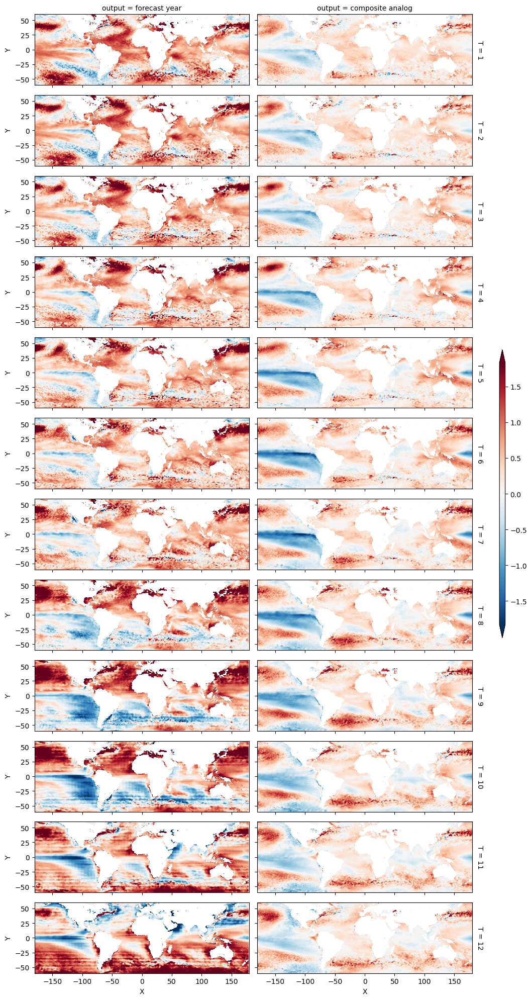

In [98]:
## Analysis SST evolution
model.composite_plot(rainfall, clim_year_start, clim_year_end, hindcast_analog_det, plot_predictor=True)

analog/ERA5_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec.nc already exists. Skipping download.
Using current month as initialization month: Dec (12)
Lead time not provided. Using months: [1, 2, 3, 4, 5] with Dec as initialization month
year_start_forecast not provided. Using current year: 2025
year_end_forecast not provided. Using current year: 2025
analog/forecast_ecmwf51_SST_DecIc_JanFebMarAprMay.nc
File 'analog/forecast_ecmwf51_SST_DecIc_JanFebMarAprMay.nc' already exists. Skipping download.
All requested SST data has been processed.


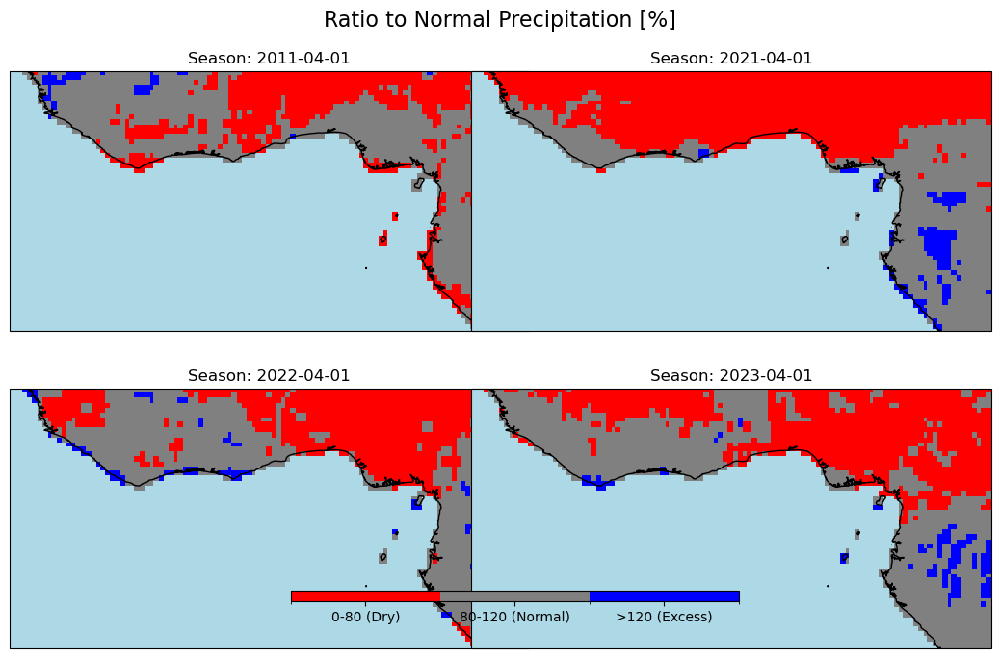

array([2011, 2021, 2022, 2023])

In [99]:
## Plot silimar years behavior
model.composite_plot(rainfall, clim_year_start, clim_year_end, hindcast_analog_det, plot_predictor=False)

#### Verification

In [100]:
score = ['Pearson']
model_name = "analog_method"

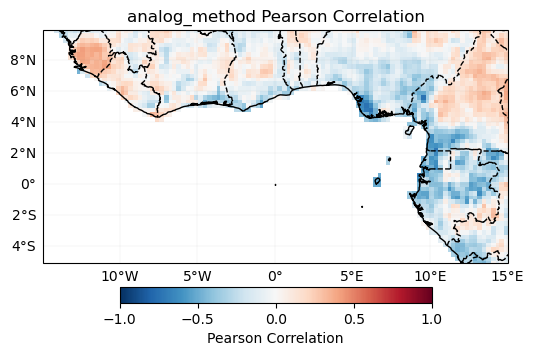

In [101]:
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall,
        hindcast_analog_det
    )
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

##### Probabilistic

In [102]:
score = ['GROC']

Generalized Discrimination Score


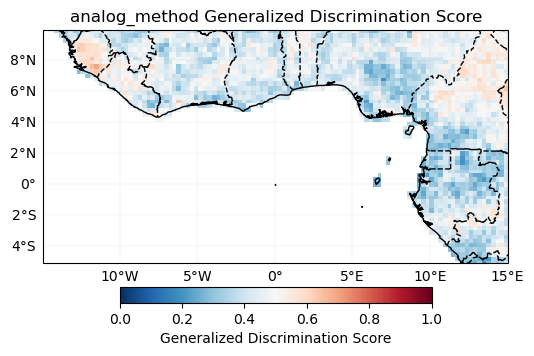

In [103]:
score = score.append('GROC') if 'GROC' not in score else score
fourth_app_scores = {}
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall,
        hindcast_analog_prob,
        clim_year_start,
        clim_year_end)
    if i == "GROC":
        fourth_app_scores['4th_approach'] = r-0.05
    was_verify.plot_model_score(r-0.05, i, dir_save_score, model_name)

### Forecast 

analog/ERA5_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec.nc already exists. Skipping download.
Using current month as initialization month: Dec (12)
Lead time not provided. Using months: [1, 2, 3, 4, 5] with Dec as initialization month
year_start_forecast not provided. Using current year: 2025
year_end_forecast not provided. Using current year: 2025
analog/forecast_ecmwf51_SST_DecIc_JanFebMarAprMay.nc
File 'analog/forecast_ecmwf51_SST_DecIc_JanFebMarAprMay.nc' already exists. Skipping download.
All requested SST data has been processed.


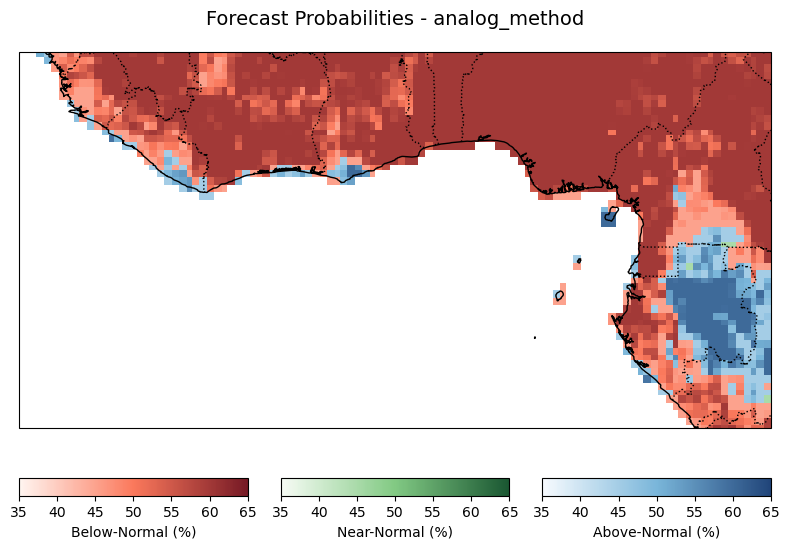

In [104]:
ddd, similar_years, forecast_det_analog, forecast_prob_analog = model.forecast(rainfall, clim_year_start, clim_year_end, hindcast_analog_det)
plot_prob_forecasts(dir_to_forecast, forecast_prob_analog, "analog_method")

# Consolidated Forecasts

In [105]:
all_scores = {}
first_app_scores.update(snd_app_scores)
first_app_scores.update(third_app_scores)
first_app_scores.update(fourth_app_scores)
all_scores['GROC'] = first_app_scores

In [106]:
if any(int(a) > int(b) for a in season for b  in season_obs):
    hindcast_weigted_det_3rd['T'] = rainfall.isel(T = slice(1,None))['T']
    hindcast_weigted_det_3rd_ = xr.concat([rainfall.isel(T=[0]),hindcast_weigted_det_3rd], dim='T') 

In [107]:
rainf, hindcast_det_gcm, hindcast_weigted_det_cca, hindcast_weigted_det_3rd_, hindcast_analog_det = xr.align(rainfall,
    hindcast_det_gcm, hindcast_weigted_det_cca, hindcast_weigted_det_3rd_.drop_vars('output').squeeze(), hindcast_analog_det
)

In [108]:
forecast_weigted_det_3rd['T'] = forecast_det_gcm['T']
forecast_det_analog['T'] = forecast_det_gcm['T']

In [109]:
forecast_det_gcm, forecast_weigted_det_cca, forecast_weigted_det_3rd, forecast_det_analog = xr.align(
    forecast_det_gcm, forecast_weigted_det_cca, forecast_weigted_det_3rd, forecast_det_analog
)

In [110]:
hindcast_det_consolidated = {}

hindcast_det_consolidated['first_approach'] = hindcast_det_gcm
hindcast_det_consolidated['2nd_approach'] = hindcast_weigted_det_cca
hindcast_det_consolidated['3rd_approach'] = hindcast_weigted_det_3rd_
hindcast_det_consolidated['4th_approach'] = hindcast_analog_det

forecast_det_consolidated = {}

forecast_det_consolidated['first_approach'] = forecast_det_gcm
forecast_det_consolidated['2nd_approach'] = forecast_weigted_det_cca
forecast_det_consolidated['3rd_approach'] = forecast_weigted_det_3rd
forecast_det_consolidated['4th_approach'] = forecast_det_analog

In [111]:
was_weight = WAS_mme_Weighted()
hindcast_det, forecast_det  = was_weight.compute(rainfall, hindcast_det_consolidated, forecast_det_consolidated, all_scores, complete=False)
hindcast_det_prob = was_weight.compute_prob(rainfall, clim_year_start, clim_year_end, hindcast_det)

#### Consolidated forecast Skill

In [112]:
score = ['Pearson']
model_name = "MME Forecast"

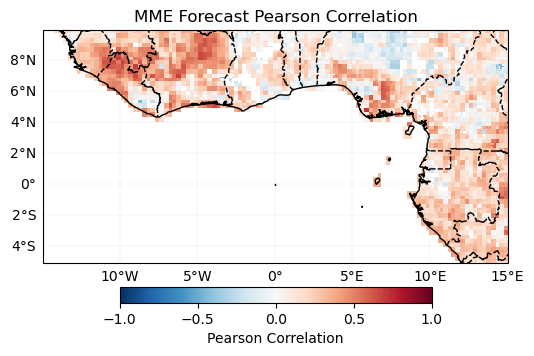

In [113]:
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall,
        hindcast_det
    )
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

##### Probabilistic

In [114]:
score = ['GROC']

Generalized Discrimination Score


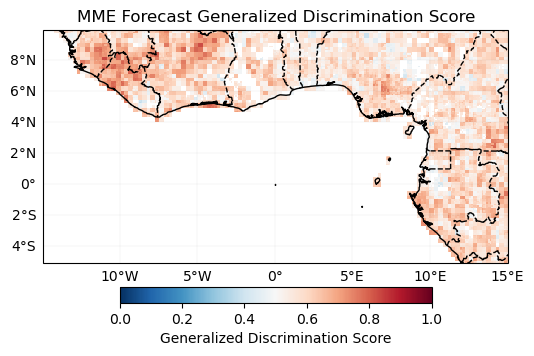

In [115]:
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall,
        hindcast_det_prob,
        clim_year_start,
        clim_year_end) 
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

##### Plot Roc curves

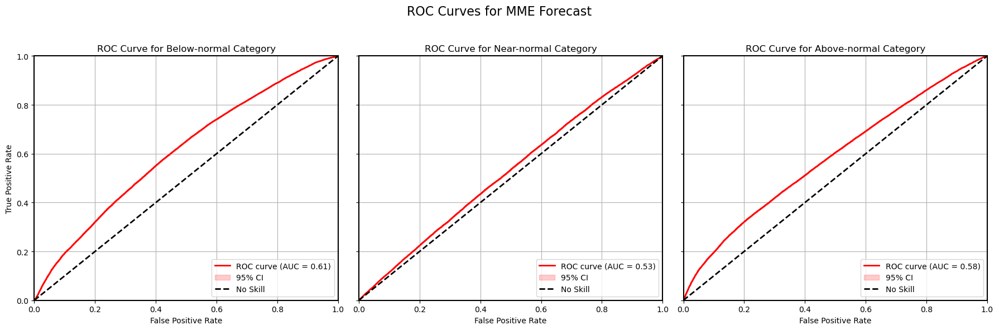

In [116]:
was_verify.plot_roc_curves(model_name, dir_save_score, rainfall, hindcast_det_prob, clim_year_start, clim_year_end, n_bootstraps=1000, ci=0.95)

##### Plot Reliability

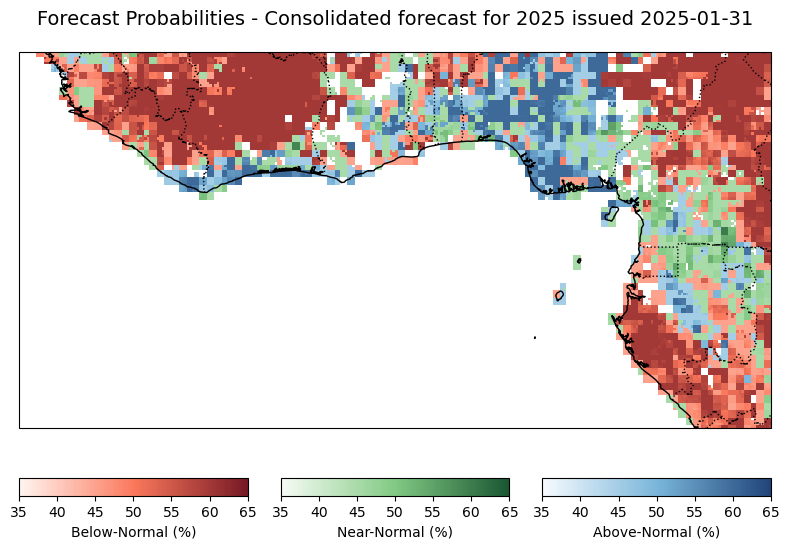

In [117]:
forecast_prob = was_weight.forecast(rainfall, clim_year_start, clim_year_end, hindcast_det, forecast_det)
plot_prob_forecasts(dir_to_forecast, forecast_prob, f"Consolidated forecast for {predictor_f['T'].dt.year.values.item()} issued {f"{datetime.today().year}-{datetime.today().month:02d}-{datetime.today().day:02d}"}")